<a href="https://colab.research.google.com/github/zw2791/Real-Data-Practices/blob/main/Credit_Card_Fraud_Detection_Data_Tidying.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Credit Card Fraud Detection Data Tidying

In [ ]:
# packages
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport

In [ ]:
# Import data
df = pd.read_csv('/application_data.csv')
cd = pd.read_csv('/columns_description.csv', encoding='cp1252')

## Inspect dataset

In [ ]:
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df.shape

(307511, 122)

In [ ]:
# Checking datatypes
# df.dtypes

## 1. Drop duplicates in ID column

In [ ]:
df.drop_duplicates(subset=['SK_ID_CURR']).shape

(307511, 72)

## 2. Check null values

### 67 columns have null values

In [ ]:
#checking percentage of null values in all columns
df_nulls = df.isnull().mean() * 100

#Number of columns having null values
len(df_nulls[df_nulls.values>0])

67

### 50 vars have more than 30% missing

In [ ]:
df_nulls = df_nulls[df_nulls.values > 30]
len(df_nulls)

50

### Exclude these vars, 72 vars left

In [ ]:
#Removing columns with more than 40 percent null values in the dataset
df.drop(df_nulls.index, axis=1, inplace = True)
df.shape

(307511, 72)

### Check missing condition

In [ ]:
df.isnull().sum()[df.isnull().sum()>0]

AMT_ANNUITY                      12
AMT_GOODS_PRICE                 278
NAME_TYPE_SUITE                1292
CNT_FAM_MEMBERS                   2
EXT_SOURCE_2                    660
EXT_SOURCE_3                  60965
OBS_30_CNT_SOCIAL_CIRCLE       1021
DEF_30_CNT_SOCIAL_CIRCLE       1021
OBS_60_CNT_SOCIAL_CIRCLE       1021
DEF_60_CNT_SOCIAL_CIRCLE       1021
DAYS_LAST_PHONE_CHANGE            1
AMT_REQ_CREDIT_BUREAU_HOUR    41519
AMT_REQ_CREDIT_BUREAU_DAY     41519
AMT_REQ_CREDIT_BUREAU_WEEK    41519
AMT_REQ_CREDIT_BUREAU_MON     41519
AMT_REQ_CREDIT_BUREAU_QRT     41519
AMT_REQ_CREDIT_BUREAU_YEAR    41519
dtype: int64

### Check vars description

In [ ]:
null = list(df.isnull().sum()[df.isnull().sum()>0].index)
cd[cd['Row'].isin(null)]

,Unnamed: 0,Row,Description,Special
9,12,AMT_ANNUITY,Loan annuity,NaN
10,13,AMT_GOODS_PRICE,For consumer loans it is the price of the good...,NaN
11,14,NAME_TYPE_SUITE,Who was accompanying client when he was applyi...,NaN
29,32,CNT_FAM_MEMBERS,How many family members does client have,NaN
42,45,EXT_SOURCE_2,Normalized score from external data source,normalized
43,46,EXT_SOURCE_3,Normalized score from external data source,normalized
91,94,OBS_30_CNT_SOCIAL_CIRCLE,How many observation of client's social surrou...,NaN
92,95,DEF_30_CNT_SOCIAL_CIRCLE,How many observation of client's social surrou...,NaN
93,96,OBS_60_CNT_SOCIAL_CIRCLE,How many observation of client's social surrou...,NaN
94,97,DEF_60_CNT_SOCIAL_CIRCLE,How many observation of client's social surrou...,NaN


### It is ok to remove some vars

In [ ]:
# make a list of vars with more than 600 missing values
df_nulls = list(df.isnull().sum()[df.isnull().sum()>600].index)
df_nulls.remove("NAME_TYPE_SUITE") # not include this since it seems cool
df_nulls.append("DAYS_LAST_PHONE_CHANGE")
# drop vars in that list
df.drop(labels=df_nulls,axis=1,inplace=True)
df.isnull().sum()[df.isnull().sum()>0]

AMT_GOODS_PRICE     278
NAME_TYPE_SUITE    1292
CNT_FAM_MEMBERS       2
dtype: int64

### Check description to see if anyone else needs to be delete

In [ ]:
cd

,Unnamed: 0,Row,Description,Special
0,1,SK_ID_CURR,ID of loan in our sample,NaN
1,2,TARGET,Target variable (1 - client with payment diffi...,NaN
2,5,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,CODE_GENDER,Gender of the client,NaN
4,7,FLAG_OWN_CAR,Flag if the client owns a car,NaN
...,...,...,...,...
155,209,DAYS_FIRST_DUE,Relative to application date of current applic...,time only relative to the application
156,210,DAYS_LAST_DUE_1ST_VERSION,Relative to application date of current applic...,time only relative to the application
157,211,DAYS_LAST_DUE,Relative to application date of current applic...,time only relative to the application
158,212,DAYS_TERMINATION,Relative to application date of current applic...,time only relative to the application


### Remove meaningless flags

In [ ]:
#FLAG vars are meaningless
flag_col = df.filter(regex='^FLAG',axis=1).columns.tolist()
flag_col.remove('FLAG_OWN_CAR')
flag_col.remove('FLAG_OWN_REALTY')

#Delete all indicator FLAG columns as they are not relevant to our analysis
df.drop(flag_col, axis = 1, inplace = True)

### 34 vars survive

In [ ]:
df.shape

(307511, 33)

## Imputing null variables

In [ ]:
impute = list(df.isnull().sum()[df.isnull().sum() > 0].index)
df[impute].head(10)

,NAME_TYPE_SUITE,CNT_FAM_MEMBERS
0,Unaccompanied,1.0
1,Family,2.0
2,Unaccompanied,1.0
3,Unaccompanied,2.0
4,Unaccompanied,1.0
5,"Spouse, partner",2.0
6,Unaccompanied,3.0
7,Unaccompanied,2.0
8,Children,2.0
9,Unaccompanied,1.0


In [ ]:
#calculating mean, median and mode for AMT_ANNUITY and AMT_GOODS_PRICE
print("AMT_ANNUITY")
print('Mean: ', df['AMT_ANNUITY'].mean())
print('Median: ', df['AMT_ANNUITY'].median())
print('Mode: ', df['AMT_ANNUITY'].mode())

print("----------------------------------")
print("AMT_GOODS_PRICE")
print('Mean: ', df['AMT_GOODS_PRICE'].mean())
print('Median: ', df['AMT_GOODS_PRICE'].median())
print('Mode: ', df['AMT_GOODS_PRICE'].mode())

AMT_ANNUITY
Mean:  27108.48784108536
Median:  24903.0
Mode:  0    9000.0
dtype: float64
----------------------------------
AMT_GOODS_PRICE
Mean:  538396.2074288895
Median:  450000.0
Mode:  0    450000.0
dtype: float64


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fd8841d6d50>]],
      dtype=object)

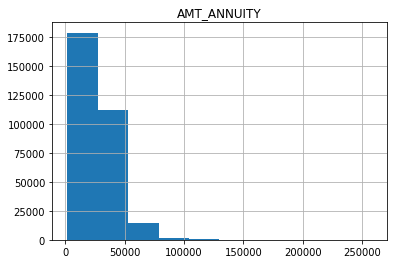

In [ ]:
df.hist(column="AMT_ANNUITY")

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fd88404f750>]],
      dtype=object)

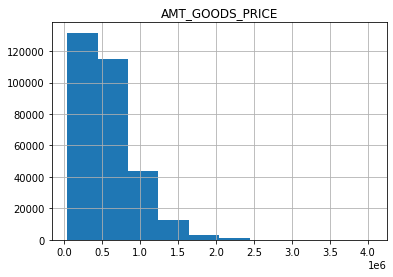

In [ ]:
df.hist(column="AMT_GOODS_PRICE")

### Impute AMT_ANNUITY with median, AMT_GOODS_PRICE with mean

In [ ]:
df['AMT_ANNUITY'].fillna(df['AMT_ANNUITY'].median(), inplace=True)
df['AMT_GOODS_PRICE'].fillna(df['AMT_GOODS_PRICE'].mean(), inplace=True)

### For NAME TYPE SUITE I add the most common one

In [ ]:
df.NAME_TYPE_SUITE.value_counts()

Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64

In [ ]:
df['NAME_TYPE_SUITE'].fillna('Unaccompanied', inplace=True)

### For CNT_FAM_MEMBERS I add median

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fd883f3f5d0>]],
      dtype=object)

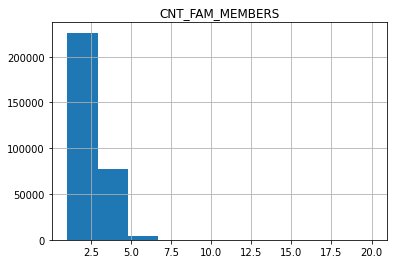

In [ ]:
df.hist(column='CNT_FAM_MEMBERS')

In [ ]:
df['CNT_FAM_MEMBERS'].fillna(df['CNT_FAM_MEMBERS'].median(), inplace=True)

### Finish imputing

In [ ]:
df.isnull().sum()

SK_ID_CURR                     0
TARGET                         0
NAME_CONTRACT_TYPE             0
CODE_GENDER                    0
FLAG_OWN_CAR                   0
FLAG_OWN_REALTY                0
CNT_CHILDREN                   0
AMT_INCOME_TOTAL               0
AMT_CREDIT                     0
AMT_ANNUITY                    0
AMT_GOODS_PRICE                0
NAME_TYPE_SUITE                0
NAME_INCOME_TYPE               0
NAME_EDUCATION_TYPE            0
NAME_FAMILY_STATUS             0
NAME_HOUSING_TYPE              0
REGION_POPULATION_RELATIVE     0
DAYS_BIRTH                     0
DAYS_EMPLOYED                  0
DAYS_REGISTRATION              0
DAYS_ID_PUBLISH                0
CNT_FAM_MEMBERS                0
REGION_RATING_CLIENT           0
REGION_RATING_CLIENT_W_CITY    0
WEEKDAY_APPR_PROCESS_START     0
HOUR_APPR_PROCESS_START        0
REG_REGION_NOT_LIVE_REGION     0
REG_REGION_NOT_WORK_REGION     0
LIVE_REGION_NOT_WORK_REGION    0
REG_CITY_NOT_LIVE_CITY         0
REG_CITY_N

## Correcting format

### CNT_FAM_MEMBERS cannot be float. Converting to integer

In [ ]:
df.CNT_FAM_MEMBERS = df.CNT_FAM_MEMBERS.apply(lambda x: int(x))

### DAYS_EMPLOYED, DAY_REGISTRATION, DAYS_ID_PUBLISH should be a positive value

In [ ]:
df.DAYS_EMPLOYED = df.DAYS_EMPLOYED.apply(lambda x: abs(x))
df.DAYS_REGISTRATION = df.DAYS_REGISTRATION.apply(lambda x: abs(x))
df.DAYS_ID_PUBLISH = df.DAYS_ID_PUBLISH.apply(lambda x: abs(x))

### make days_birth just age

In [ ]:
#Dividing by -365.25 to include leap years
df['Age'] = df['DAYS_BIRTH'] //-365.25

In [ ]:
df.drop('DAYS_BIRTH', axis = 1, inplace = True)

# Done

In [ ]:
# df.head(10)

In [ ]:
from pandas_profiling import ProfileReport

In [ ]:
profile = ProfileReport(df, html={'style':{'full_width':True}})

In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_file("Analysis.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]